In [1]:
from pyDeepInsight import ImageTransformer, LogScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
import pandas as pd
import numpy as np

from sklearn.metrics import classification_report
from scipy import linalg as scipy_linalg
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, classification_report, plot_confusion_matrix
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

import itertools


In [2]:
prosody_data = pd.read_csv('Prosodic_Features_MRH.csv',sep=",")
#expr = pd.read_csv(expr_file, sep="\t")
y = prosody_data['Hired3C'].values
#36
#X =prosody_data[['duration', 'energy', 'power', 'min_pitch', 'max_pitch', 'mean_pitch', 'pitch_sd', 'pitch_abs', 'pitch_quant', 'pitchUvsVRatio', 'Time:8', 'iDifference', 'diffPitchMaxMin', 'diffPitchMaxMean', 'diffPitchMaxMode', 'intensityMin', 'intensityMax', 'intensityMean', 'intensitySD', 'intensityQuant', 'diffIntMaxMin', 'diffIntMaxMean', 'diffIntMaxMode', 'avgVal1', 'avgVal2', 'avgVal3', 'avgBand1', 'avgBand2', 'avgBand3', 'fmean1', 'fmean2', 'fmean3', 'f2meanf1', 'f3meanf1', 'f1STD', 'f2STD']]
#49X =prosody_data[['duration', 'energy', 'power', 'min_pitch', 'max_pitch', 'mean_pitch', 'pitch_sd', 'pitch_abs', 'pitch_quant', 'pitchUvsVRatio', 'Time:8', 'iDifference', 'diffPitchMaxMin', 'diffPitchMaxMean', 'diffPitchMaxMode', 'intensityMin', 'intensityMax', 'intensityMean', 'intensitySD', 'intensityQuant', 'diffIntMaxMin', 'diffIntMaxMean', 'diffIntMaxMode', 'avgVal1', 'avgVal2', 'avgVal3', 'avgBand1', 'avgBand2', 'avgBand3', 'fmean1', 'fmean2', 'fmean3', 'f2meanf1', 'f3meanf1', 'f1STD', 'f2STD', 'f3STD', 'f2STDf1', 'f2STDf2', 'jitter', 'shimmer', 'jitterRap', 'meanPeriod', 'percentUnvoiced', 'numVoiceBreaks', 'PercentBreaks', 'speakRate', 'numPause', 'maxDurPause']]
#25X = prosody_data[['pitch_quant', 'meanPeriod', 'mean_pitch', 'fmean3', 'f3STD', 'f2STD', 'pitch_sd', 'shimmer', 'avgBand2', 'intensityMean', 'jitter', 'intensitySD', 'intensityQuant', 'jitterRap', 'f1STD', 'avgVal2', 'fmean2', 'PercentBreaks', 'AvgTotFall:3', 'f2STDf1', 'pitch_abs', 'f2STDf2', 'avgBand1', 'percentUnvoiced', 'AvgTotRis:3']]
X = prosody_data.iloc[:, 6:].values


In [3]:
dA = pd.read_csv('prosodic_features_M1.csv ')
yRH = prosody_data['RecommendHiring']
cRH = prosody_data['Hired3C']

In [4]:
X = StandardScaler().fit_transform(X)
#X = MinMaxScaler().fit_transform(X)

In [5]:
from sklearn.decomposition import PCA
pca = PCA(n_components=20)
pca.fit(X)
X_pca = pca.transform(X)
principalDf = pd.DataFrame(data = X_pca , columns = ['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20'])
principalDf

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,-4.168954,-0.014177,-2.475345,-0.810887,0.158383,-1.744078,-0.390702,0.265558,0.664755,1.053834,0.852547,-1.198337,0.200060,-0.733512,-1.235062,0.103713,1.158194,-0.448425,-0.798101,-0.337597
1,-4.464238,-1.009904,-3.092034,-1.055293,0.230520,-2.541514,-0.267613,0.678307,0.507352,1.239578,0.995473,-1.702559,0.455349,-0.275812,0.053663,0.166603,1.432344,-0.266058,-0.719310,-0.078797
2,-3.358534,0.101685,-2.585497,0.410778,1.336423,-2.501500,-0.698387,-0.107751,0.624624,1.094851,0.804493,-1.841714,0.020696,0.410408,0.199660,-0.220519,1.292856,-0.223128,-0.221233,0.060447
3,0.865701,-2.990583,-3.409886,3.427491,1.778394,-1.202344,0.742876,-1.396202,1.127660,-2.928787,-0.275889,-2.670811,-0.624270,-0.108663,0.953177,1.146498,1.633984,-0.566122,0.949785,0.610895
4,1.506023,-3.118672,-3.273643,1.326754,1.733809,-1.359053,1.285821,-1.184058,0.794970,-2.643698,0.574301,-1.356922,-0.637008,-0.660169,1.174457,1.339933,1.470933,-0.388274,1.199015,-0.148618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,-1.722865,0.621413,-2.511901,3.169306,-2.441883,-1.714762,-0.227481,0.926876,-1.283813,0.087163,0.307396,0.515534,1.552994,0.432337,-0.029461,-0.957214,0.665787,-0.728923,0.637343,-0.351798
676,-2.157176,0.879941,-2.401855,1.721035,-2.208042,-2.682219,-0.636729,1.491810,-1.361853,0.804770,0.408121,0.674541,2.267876,0.250258,0.651264,-1.064458,0.207368,-0.407262,-0.112696,-0.125447
677,-2.407032,2.363606,-1.592129,4.621724,-3.687422,0.870559,1.078026,-1.171055,-1.566512,-2.676465,0.168669,0.383442,1.421386,1.610889,0.787214,-0.769418,0.922026,-0.664200,0.114926,-0.676828
678,-0.943823,3.709886,-0.265405,3.604097,-0.754180,-2.480952,-0.034924,1.060393,-0.914385,0.231077,0.813393,0.337746,1.709116,0.380986,0.315785,-0.862221,0.346017,-0.474712,-0.509913,-0.357955


In [6]:
print('Variance of each component:', pca.explained_variance_ratio_)
print('\n Total Variance Explained:', round(sum(list(pca.explained_variance_ratio_))*100, 10))

Variance of each component: [0.22143425 0.16851797 0.09213142 0.08800173 0.06151173 0.05784391
 0.03947719 0.02957104 0.02898775 0.02342824 0.02005332 0.01888711
 0.01755324 0.01516364 0.01337228 0.01257713 0.01059231 0.00898099
 0.00833447 0.006764  ]

 Total Variance Explained: 94.3183710242


In [7]:
finalDf = pd.concat([principalDf, prosody_data[['Hired3C']]], axis = 1)
finalDf

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,Hired3C
0,-4.168954,-0.014177,-2.475345,-0.810887,0.158383,-1.744078,-0.390702,0.265558,0.664755,1.053834,...,-1.198337,0.200060,-0.733512,-1.235062,0.103713,1.158194,-0.448425,-0.798101,-0.337597,1
1,-4.464238,-1.009904,-3.092034,-1.055293,0.230520,-2.541514,-0.267613,0.678307,0.507352,1.239578,...,-1.702559,0.455349,-0.275812,0.053663,0.166603,1.432344,-0.266058,-0.719310,-0.078797,1
2,-3.358534,0.101685,-2.585497,0.410778,1.336423,-2.501500,-0.698387,-0.107751,0.624624,1.094851,...,-1.841714,0.020696,0.410408,0.199660,-0.220519,1.292856,-0.223128,-0.221233,0.060447,1
3,0.865701,-2.990583,-3.409886,3.427491,1.778394,-1.202344,0.742876,-1.396202,1.127660,-2.928787,...,-2.670811,-0.624270,-0.108663,0.953177,1.146498,1.633984,-0.566122,0.949785,0.610895,1
4,1.506023,-3.118672,-3.273643,1.326754,1.733809,-1.359053,1.285821,-1.184058,0.794970,-2.643698,...,-1.356922,-0.637008,-0.660169,1.174457,1.339933,1.470933,-0.388274,1.199015,-0.148618,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,-1.722865,0.621413,-2.511901,3.169306,-2.441883,-1.714762,-0.227481,0.926876,-1.283813,0.087163,...,0.515534,1.552994,0.432337,-0.029461,-0.957214,0.665787,-0.728923,0.637343,-0.351798,0
676,-2.157176,0.879941,-2.401855,1.721035,-2.208042,-2.682219,-0.636729,1.491810,-1.361853,0.804770,...,0.674541,2.267876,0.250258,0.651264,-1.064458,0.207368,-0.407262,-0.112696,-0.125447,0
677,-2.407032,2.363606,-1.592129,4.621724,-3.687422,0.870559,1.078026,-1.171055,-1.566512,-2.676465,...,0.383442,1.421386,1.610889,0.787214,-0.769418,0.922026,-0.664200,0.114926,-0.676828,0
678,-0.943823,3.709886,-0.265405,3.604097,-0.754180,-2.480952,-0.034924,1.060393,-0.914385,0.231077,...,0.337746,1.709116,0.380986,0.315785,-0.862221,0.346017,-0.474712,-0.509913,-0.357955,0


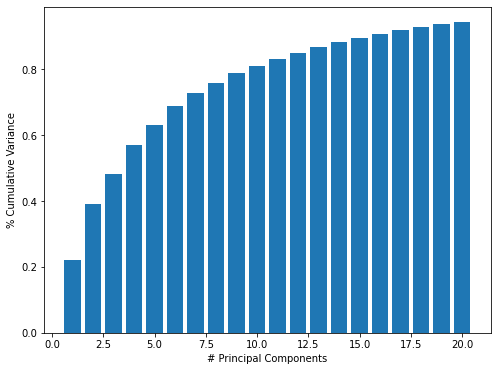

In [8]:
cum_exp_var = []
var_exp = 0
for i in pca.explained_variance_ratio_:
    var_exp += i
    cum_exp_var.append(var_exp)

# Plot cumulative explained variance for all PCs

fig, ax = plt.subplots(figsize=(8,6))
ax.bar(range(1,21), cum_exp_var)
ax.set_xlabel('# Principal Components')
ax.set_ylabel('% Cumulative Variance');

In [9]:
# Calculate the variance explained by priciple components
print('Variance of each component:', pca.explained_variance_ratio_)
print('\n Total Variance Explained:', round(sum(list(pca.explained_variance_ratio_))*100, 10))

Variance of each component: [0.22143425 0.16851797 0.09213142 0.08800173 0.06151173 0.05784391
 0.03947719 0.02957104 0.02898775 0.02342824 0.02005332 0.01888711
 0.01755324 0.01516364 0.01337228 0.01257713 0.01059231 0.00898099
 0.00833447 0.006764  ]

 Total Variance Explained: 94.3183710242


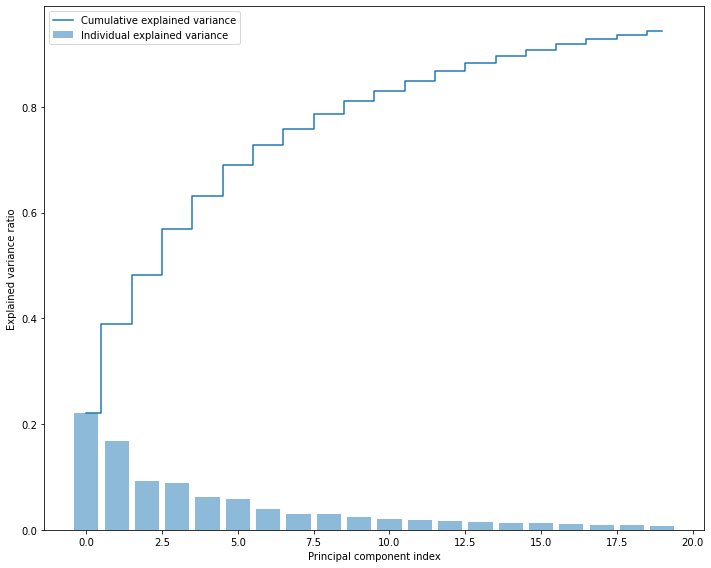

In [10]:

exp_var_pca = pca.explained_variance_ratio_
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.figure(figsize=(10,8))
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [11]:
#parallel cocordinate graph
# Import the library
import plotly.express as px

# Create the chart:
fig = px.parallel_coordinates(
    principalDf, 
    color=prosody_data["Hired3C"], 
    color_continuous_scale=px.colors.diverging.Tealrose,
    color_continuous_midpoint=1)

# Hide the color scale that is useless in this case
fig.update_layout(coloraxis_showscale=False)

# Show the plot
fig.show()

In [12]:
df=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20']]
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = finalDf["Hired3C"],colorscale = [[0, 'green'], [0.5, 'red'], [1.0, 'rgb(0,0 , 255)']],showscale = True),
        #line = dict(color = MRH,colorscale = 'Electric', showscale = True, cmin = -4000, cmax = -100),
         dimensions = list([
            dict(range = [min(df['PC1']),max(df['PC1'])], constraintrange = [-12,12], label = 'PC1', values = df['PC1']),
            dict(range = [min(df['PC2']),max(df['PC2'])], label = 'PC2', values = df['PC2']),
            dict(range = [min(df['PC3']),max(df['PC3'])], label = 'PC3', values = df['PC3']),
            dict(range = [min(df['PC4']),max(df['PC4'])], label = 'PC4', values = df['PC4']),
            dict(range = [min(df['PC5']),max(df['PC5'])], label = 'PC5', values = df['PC5']),
            dict(range = [min(df['PC6']),max(df['PC6'])], label = 'PC6', values = df['PC6']),
            dict(range = [min(df['PC7']),max(df['PC7'])], label = 'PC7', values = df['PC7']),
            dict(range = [min(df['PC8']),max(df['PC8'])], label = 'PC8', values = df['PC8']),
            dict(range = [min(df['PC9']),max(df['PC9'])], label = 'PC9', values = df['PC9']),
            dict(range = [min(df['PC10']),max(df['PC10'])], label = 'PC10', values = df['PC10']),
            dict(range = [min(df['PC11']),max(df['PC11'])], label = 'PC11', values = df['PC11']),
            dict(range = [min(df['PC12']),max(df['PC12'])], label = 'PC12', values = df['PC12']),
            dict(range = [min(df['PC13']),max(df['PC13'])], label = 'PC13', values = df['PC13']),
            dict(range = [min(df['PC14']),max(df['PC14'])], label = 'PC14', values = df['PC14']),
            dict(range = [min(df['PC15']),max(df['PC15'])], label = 'PC15', values = df['PC15']),
            dict(range = [min(df['PC16']),max(df['PC16'])], label = 'PC16', values = df['PC16']),
            dict(range = [min(df['PC17']),max(df['PC17'])], label = 'PC17', values = df['PC17']),
            dict(range = [min(df['PC18']),max(df['PC18'])], label = 'PC18', values = df['PC18']),
            dict(range = [min(df['PC19']),max(df['PC19'])], label = 'PC19', values = df['PC19']),
            dict(range = [min(df['PC20']),max(df['PC20'])], label = 'PC20', values = df['PC20'])
            
        ])
       
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

In [13]:
df=finalDf[['PC1', 'PC2', 'PC4','PC5']]
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = finalDf["Hired3C"],colorscale = [[0, 'green'], [0.5, 'red'], [1.0, 'rgb(0,0 , 255)']],showscale = True),
        #line = dict(color = MRH,colorscale = 'Electric', showscale = True, cmin = -4000, cmax = -100),
         dimensions = list([
            dict(range = [min(df['PC1']),max(df['PC1'])], constraintrange = [-12,12], label = 'PC1', values = df['PC1']),
            dict(range = [min(df['PC5']),max(df['PC5'])], label = 'PC5', values = df['PC5']),
            dict(range = [min(df['PC4']),max(df['PC4'])], label = 'PC4', values = df['PC4']),
            dict(range = [min(df['PC2']),max(df['PC2'])], label = 'PC2', values = df['PC2']),
            
            
            
           
        ])
       
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

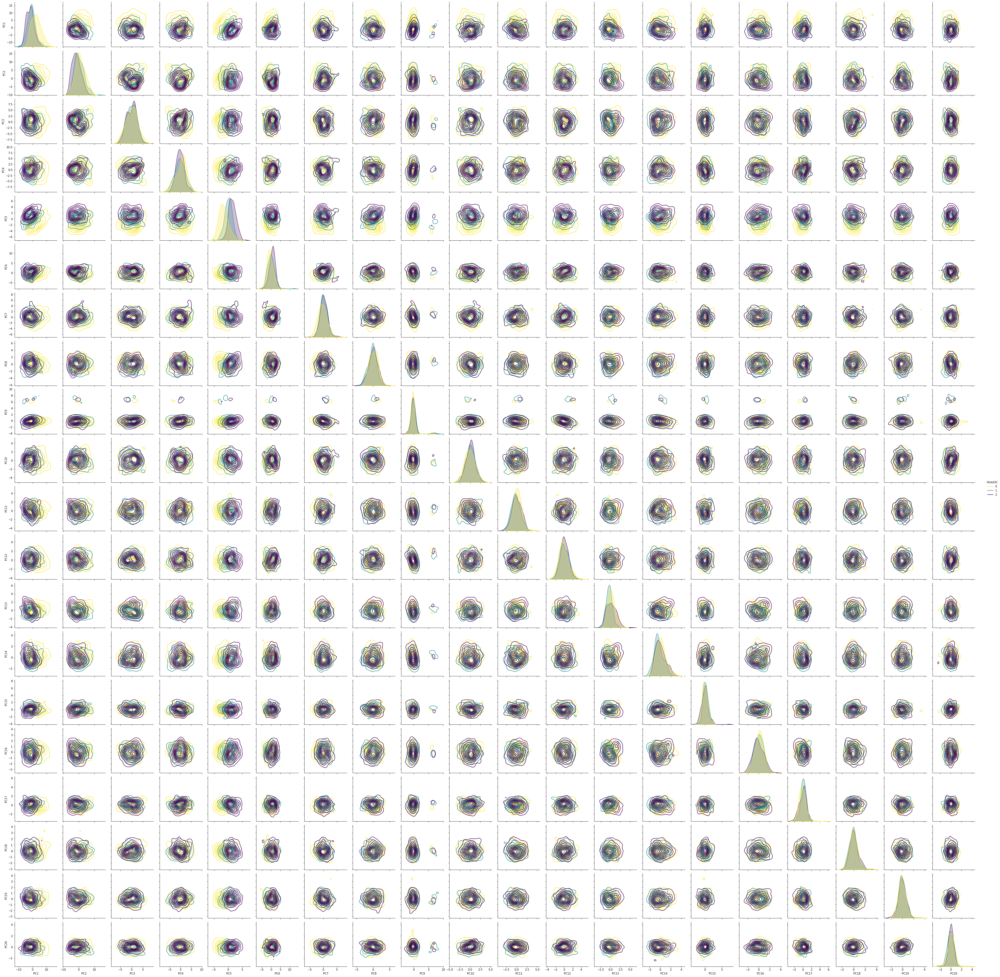

In [14]:
df1=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20','Hired3C']]
sns.pairplot(df1,hue='Hired3C',kind='kde',palette='viridis_r')

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\A

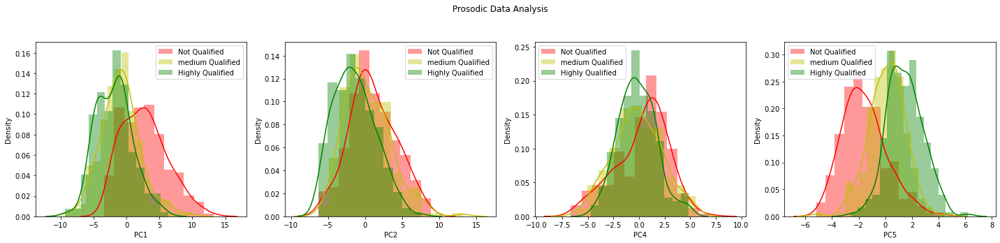

In [15]:
df1=finalDf[['PC1', 'PC2', 'PC4','PC5']]
fig = plt.figure(figsize = (20, 25))
j = 0
for i in df1.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(df1[i][finalDf['Hired3C']==0], color='r', label = 'Not Qualified')
    sns.distplot(df1[i][finalDf['Hired3C']==1], color='y', label = 'medium Qualified')
    sns.distplot(df1[i][finalDf['Hired3C']==2], color='g', label = 'Highly Qualified')
    plt.legend(loc='best')
fig.suptitle('Prosodic Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

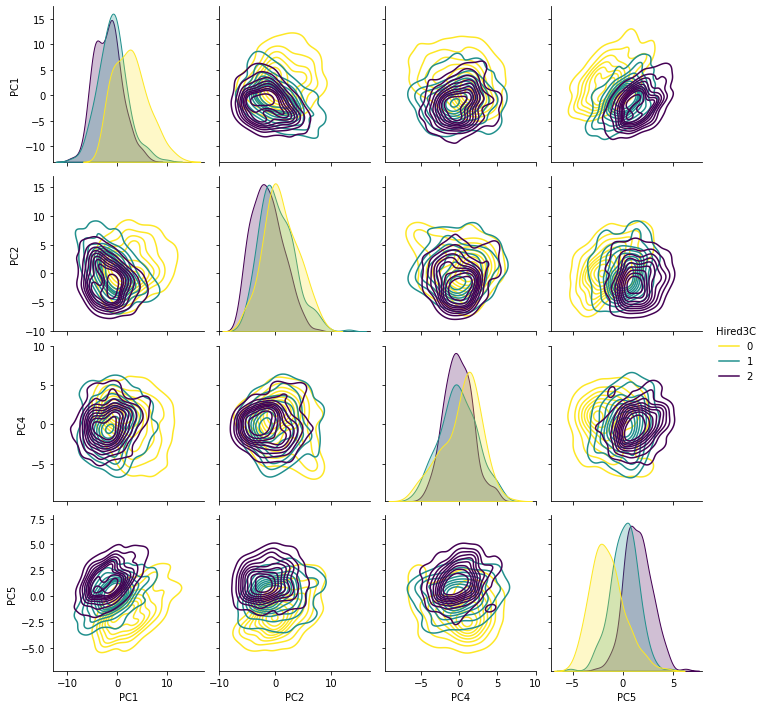

In [16]:
df1=finalDf[['PC1', 'PC2','PC4','PC5','Hired3C']]
sns.pairplot(df1,hue='Hired3C',kind='kde',palette='viridis_r')

In [17]:
df=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20','PC21', 'PC22','PC23', 'PC24','PC25']]
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = finalDf["Hired3C"],colorscale = [[0, 'green'], [0.5, 'red'], [1.0, 'rgb(0,0 , 255)']],showscale = True),
        #line = dict(color = MRH,colorscale = 'Electric', showscale = True, cmin = -4000, cmax = -100),
         dimensions = list([
            dict(range = [min(df['PC1']),max(df['PC1'])], constraintrange = [1,2], label = 'PC1', values = df['PC1']),
            dict(range = [min(df['PC2']),max(df['PC2'])], label = 'PC2', values = df['PC2']),
            dict(range = [min(df['PC6']),max(df['PC6'])], label = 'PC6', values = df['PC6']),
            dict(range = [min(df['PC9']),max(df['PC9'])], label = 'PC9', values = df['PC9']),
            dict(range = [min(df['PC15']),max(df['PC15'])], label = 'PC15', values = df['PC15']),
            dict(range = [min(df['PC3']),max(df['PC3'])], label = 'PC3', values = df['PC3']),
            dict(range = [min(df['PC4']),max(df['PC4'])], label = 'PC4', values = df['PC4']),
            dict(range = [min(df['PC7']),max(df['PC7'])], label = 'PC7', values = df['PC7']),
            dict(range = [min(df['PC5']),max(df['PC5'])], label = 'PC5', values = df['PC5']),
            dict(range = [min(df['PC17']),max(df['PC17'])], label = 'PC17', values = df['PC17']),
            dict(range = [min(df['PC13']),max(df['PC13'])], label = 'PC13', values = df['PC13']),
            dict(range = [min(df['PC8']),max(df['PC8'])], label = 'PC8', values = df['PC8']),          
            dict(range = [min(df['PC11']),max(df['PC11'])], label = 'PC11', values = df['PC11']),
            dict(range = [min(df['PC12']),max(df['PC12'])], label = 'PC12', values = df['PC12']),
            dict(range = [min(df['PC10']),max(df['PC10'])], label = 'PC10', values = df['PC10']),
            dict(range = [min(df['PC20']),max(df['PC20'])], label = 'PC20', values = df['PC20']),
            dict(range = [min(df['PC14']),max(df['PC14'])], label = 'PC14', values = df['PC14']),      
            dict(range = [min(df['PC19']),max(df['PC19'])], label = 'PC19', values = df['PC19']),
            dict(range = [min(df['PC18']),max(df['PC18'])], label = 'PC18', values = df['PC18']),
            dict(range = [min(df['PC16']),max(df['PC16'])], label = 'PC16', values = df['PC16']),
            dict(range = [min(df['PC21']),max(df['PC21'])], label = 'PC21', values = df['PC21']),
            dict(range = [min(df['PC24']),max(df['PC24'])], label = 'PC24', values = df['PC24']),
            dict(range = [min(df['PC23']),max(df['PC23'])], label = 'PC23', values = df['PC23']),
            dict(range = [min(df['PC22']),max(df['PC22'])], label = 'PC22', values = df['PC22']),
            dict(range = [min(df['PC25']),max(df['PC25'])], label = 'PC25', values = df['PC25']),
             
        ])
       
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

KeyError: "['PC21', 'PC24', 'PC22', 'PC23', 'PC25'] not in index"

In [ ]:
#ascending order
pcComponents = [max(df['PC1']),max(df['PC2']),max(df['PC3']),max(df['PC4']),max(df['PC5']),max(df['PC6']),max(df['PC7']),max(df['PC8']),max(df['PC9']),max(df['PC10']),max(df['PC11']),max(df['PC12']),max(df['PC13']),max(df['PC14']),max(df['PC15']),max(df['PC16']),max(df['PC17']),max(df['PC18']),max(df['PC19']),max(df['PC20']),max(df['PC21']),max(df['PC22']),max(df['PC23']),max(df['PC24']),max(df['PC25'])]
pcComponents.sort()

pcComp ={'PC1': max(df['PC1']),
        'PC2': max(df['PC2']),
        'PC3': max(df['PC3']),
        'PC4': max(df['PC4']),
        'PC5': max(df['PC5']),
        'PC6': max(df['PC6']),
        'PC7': max(df['PC7']),
        'PC8': max(df['PC8']),
        'PC9': max(df['PC9']),
        'PC10': max(df['PC10']),
        'PC11': max(df['PC11']),
        'PC12': max(df['PC12']),
        'PC13': max(df['PC13']),
        'PC14': max(df['PC14']),
        'PC15': max(df['PC15']),
        'PC16': max(df['PC16']),
        'PC17': max(df['PC17']),
        'PC18': max(df['PC18']),
        'PC19': max(df['PC19']),
        'PC20': max(df['PC20']),
        'PC21': max(df['PC21']),
        'PC22': max(df['PC22']),
        'PC23': max(df['PC23']),
        'PC24': max(df['PC24']),
        'PC25': max(df['PC25'])}


sort_pcComp = sorted(pcComp.items(), key=lambda x: x[1], reverse=True)

for i in sort_pcComp:
    print(i[0], i[1])

In [ ]:
pca.explained_variance_ratio_

In [ ]:
Hr = np.array(prosody_data['Hired3C'].value_counts())
arr = prosody_data['Hired3C']
lb = ['Not Qualified','Highly Qualified','Medium Qualified']
print(lb)
plt.rcParams.update({'font.size':16})#figure.figsize':[10,10],
plt.pie(Hr,labels = lb, autopct = '%0.2f')
plt.title("Percentage %")

arrLB = []
for i in arr:
    if(i==2):
        arrLB.append('Highly Qualified')
    elif(i==1):
        arrLB.append('Medium Qualified')
    else:
        arrLB.append('Not Qualified')
print("Highly Qualified: ",arrLB.count('Highly Qualified'))
print("Medium Qualified: ",arrLB.count('Medium Qualified'))
print("Not Qualified: ",arrLB.count('Not Qualified'))

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(yRH,X_pca[:,0],c=finalDf['Hired3C'],cmap='plasma')
plt.xlabel('Recommend Hiring')
plt.ylabel('pc1')

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(X_pca[:,0],X_pca[:,1],c=finalDf['Hired3C'],cmap='plasma')
plt.xlabel('pc1')
plt.ylabel('pc2')

In [ ]:
sns.boxplot(x=finalDf['Hired3C'], y=X_pca[:,1],data= finalDf).set(
    xlabel='RecommendHiring', 
)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(X_pca[:,0],X_pca[:,1],X_pca[:,2], c=finalDf['Hired3C'],cmap='plasma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

In [ ]:
x = finalDf['PC1']
y =yRH
z = finalDf['PC2']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='o')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC1', fontweight ='bold')
ax.set_ylabel('Recommend Hiring', fontweight ='bold')
ax.set_zlabel('PC2', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x)
plt.ylabel('Recommend Hiring')
plt.xlabel('PC1')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(z, y, c=finalDf['Hired3C'], cmap= 'plasma_r')
plt.ylabel('Recommend Hiring')
plt.xlabel('PC2')


In [ ]:
x = finalDf['PC1']
y =finalDf['PC2']
z = finalDf['PC3']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='o')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC1', fontweight ='bold')
ax.set_ylabel('PC2', fontweight ='bold')
ax.set_zlabel('PC3', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x)
plt.ylabel('PC2')
plt.xlabel('PC1')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(y, z, c=finalDf['Hired3C'], cmap= 'plasma_r')
plt.ylabel('PC3')
plt.xlabel('PC2')


In [ ]:
x = finalDf['PC4']
y =finalDf['PC5']
z = finalDf['PC6']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC4', fontweight ='bold')
ax.set_ylabel('PC5', fontweight ='bold')
ax.set_zlabel('PC6', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x,marker ='^')
plt.ylabel('PC4')
plt.xlabel('PC5')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(y, z, c=finalDf['Hired3C'], cmap= 'plasma_r',marker ='^')
plt.ylabel('PC5')
plt.xlabel('PC6')


In [ ]:
x = finalDf['PC4']
y = yRH#finalDf['RecommendHiring']
z = finalDf['PC6']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC4', fontweight ='bold')
ax.set_ylabel('RecommendHiring', fontweight ='bold')
ax.set_zlabel('PC6', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x,marker ='^')
plt.ylabel('PC4')
plt.xlabel('RecommendHiring')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(y, z, c=finalDf['Hired3C'], cmap= 'plasma_r',marker ='^')
plt.ylabel('RecommendHiring')
plt.xlabel('PC6')


In [ ]:
X_centered = X - np.mean(X, axis=0)
cov_matrix = np.dot(X_centered.T, X_centered) / 25
eigenvalues = pca.explained_variance_
eigenvalue_arr = []
eigenvector_arr=[]
for eigenvalue, eigenvector in zip(eigenvalues, pca.components_):    
    print("\n\nEigenvector:",np.dot(eigenvector.T, np.dot(cov_matrix, eigenvector)))
    print("Eigenvalue:",eigenvalue)
    eigenvector_arr.append(np.dot(eigenvector.T, np.dot(cov_matrix, eigenvector)))
    eigenvalue_arr.append(eigenvalue)

In [ ]:


plt.figure(figsize=(10,10))

#plt.plot(eigenvector_arr)
plt.plot(eigenvalue_arr)
plt.xlabel('pc')
plt.ylabel('eigenvalues')



In [ ]:
lb = ['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20','PC21', 'PC22','PC23', 'PC24','PC25']
plt.figure(figsize=(14,14))
plt.rcParams.update({'font.size':8})#figure.figsize':[10,10],
plt.pie(eigenvalue_arr,labels = lb, autopct = '%0.2f')
plt.title("Percentage %")



In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(eigenvector_arr,eigenvalue_arr,s=50)
plt.xlabel('PC')
plt.ylabel('eigenvalues')

In [ ]:
def CreateModel( X_train, X_test, y_train, y_test):
    y_21_test = []
    for i in y_test:
        if(i == 2):
            y_21_test.append(2)
        else:
            y_21_test.append(1)

    y_21_train = []
    for i in y_train:
        if(i == 2):
            y_21_train.append(2)
        else:
            y_21_train.append(1)

    X = X_train
    y = y_21_train
    clf = XGBClassifier()
    clf.fit(X, y)
    clf.score(X, y)
    #AdaBoostClassifier(n_estimators=100, random_state=0)
    y_21_predict=clf.predict(X_test)
    target_names = ['class 2', 'class 1']      
    print(classification_report(y_21_test,y_21_predict,target_names=target_names, zero_division=0))

    X_10_train = X_train.loc[y_train!= 2]
    #X_10_train =X_train[:,26] != 2
    X_10_test = X_test.loc[y_test!= 2]
    #X_10_test = X_test[:,26] != 2
    #select from y_train where y value is not 2
    y_10_train= []
    for i in y_train:
        if(i != 2):
            y_10_train.append(i)

    #select from y_test where y value is not 2
    y_10_test = []
    for i in y_test:
        if(i != 2):
            y_10_test.append(i)

    X = X_10_train
    y = y_10_train
    clf = XGBClassifier() #colsample_bytree= 0.6655392754230048, gamma= 4.198875359789924, max_depth= 17, min_child_weight= 1.0, reg_alpha= 57.0, reg_lambda= 0.896332305739873
    clf.fit(X, y)
    clf.score(X, y)
    y_10_predict = clf.predict(X_10_test)
    target_names = ['class 1', 'class 0']      
    print(classification_report(y_10_test,y_10_predict ,target_names=target_names, zero_division=0))

    y1=list(y_test)
    y2=list(y_21_predict)
    y3=list(y_10_predict)
    combined_Predictions = []
    k=0
    for (i,j) in zip(y1,y2):
        if(i!=2):
            combined_Predictions.append(y3[k])
            k=k+1
        else:
            combined_Predictions.append(j)
    #target_names = ['class 0', 'class 1', 'class 2']
    #print(classification_report(y_test,combined_Predictions ,target_names=target_names, zero_division=0))
    acc = accuracy_score(y_test, combined_Predictions, normalize=True)

    return acc 


In [ ]:
skf = StratifiedKFold(n_splits=10,shuffle=True, random_state=12)
cvscores =[]
X= finalDf[['PC1', 'PC2','PC3', 'PC4','PC5', 'PC6','PC7', 'PC8','PC9', 'PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20','PC21', 'PC22','PC23', 'PC24','PC25']]
y=finalDf['Hired3C']
for train_index, test_index in skf.split(X, y):


    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]

    
    scores = CreateModel( X_train, X_test, y_train, y_test)
    
    
    cvscores.append(scores*100)
print(cvscores ) 
print("CV Score: %.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))
